In [1]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import mean_squared_error
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap
from core.utils import pro2label, attr2tag
from collections import Counter

In [2]:
img_dir = Path("../imgs/")
task_name = "enrich_reg"
data_path = Path(f"../prediction/attribution/{task_name}_aa_attribution_summary.csv")
key_positions = [2, 5, 6, 10]

In [3]:
data = pd.read_csv(data_path)

# 选择大于 log10(1000) 富集度的
# data = data[data["label"] > 2]
print(len(data))

data["attribution_tag"] = [attr2tag(x) for x in data["attribution"].tolist()]

# Capitalize the 'sub_name' outside of the function to optimize performance
data["sub_name"] = data["sub_name"].str.capitalize()

276435


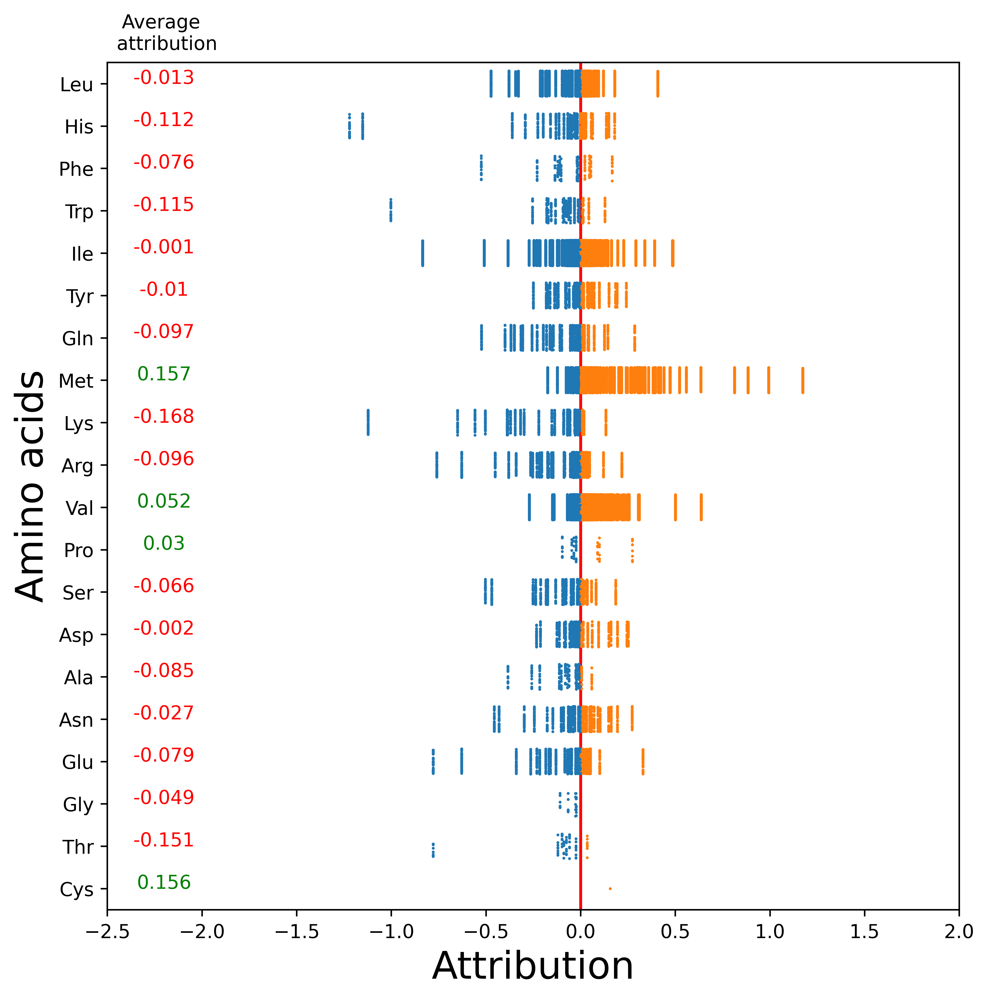

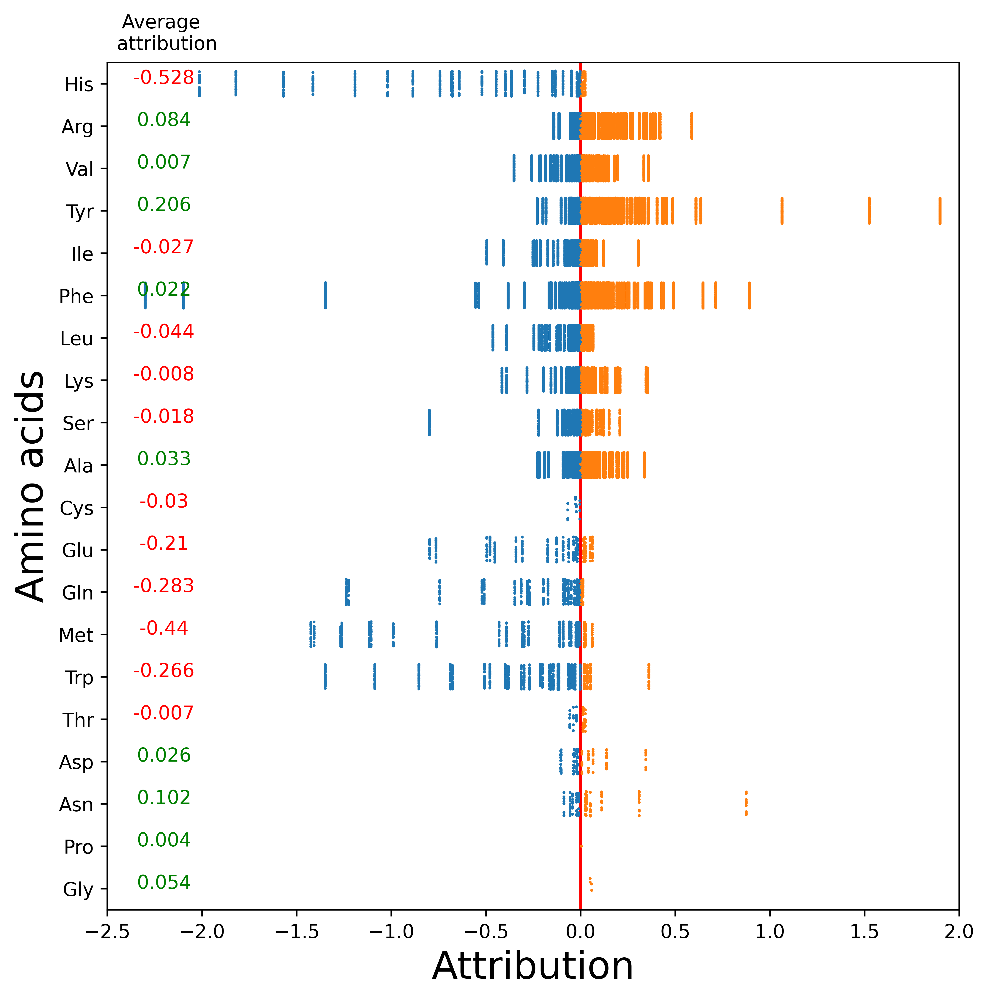

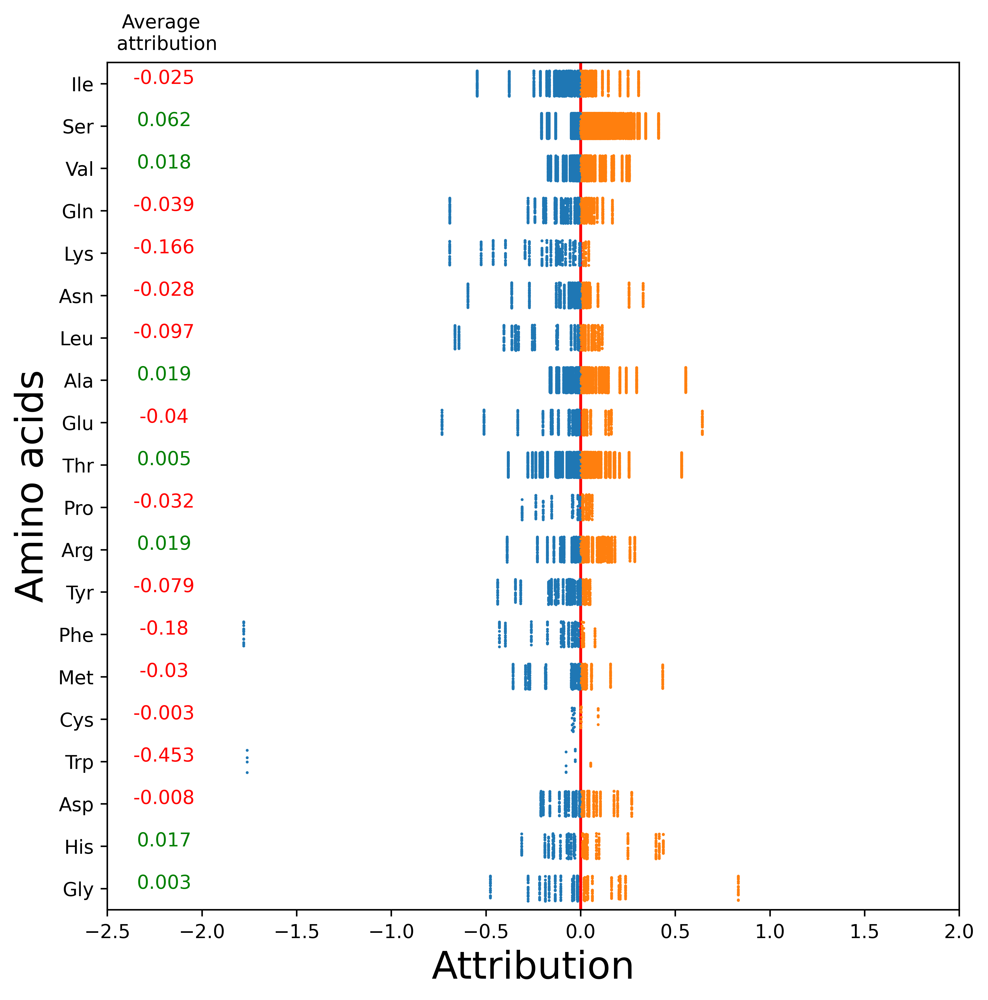

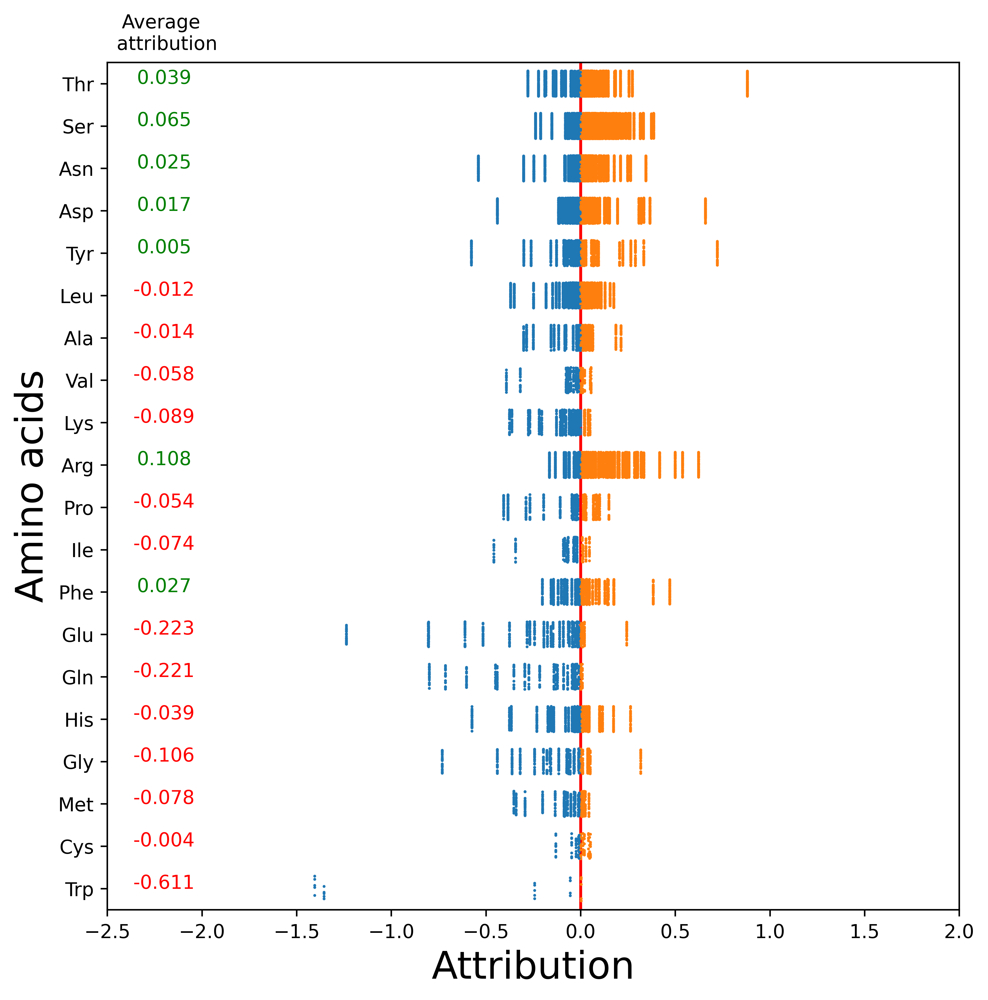

In [4]:
def add_text_to_plot(plot, x_coord, y_coord, text, color="black", ha="center"):
    """Utility function to add text to the plot."""
    plot.text(x_coord, y_coord, text, color=color, ha=ha)

def plot_strip(
    data,
    pos=0,
    sample_size=500,
    figsize=(8, 8),
    modulo_val=15,
    dpi=600,
    random_seed=42,
):
    """
    Plot data for given position.

    Parameters:
    - data: DataFrame to be plotted
    - pos: Position value to filter data
    - sample_size: Number of samples to draw from filtered data
    - figsize: Size of the figure
    - modulo_val: Value to calculate position index
    - dpi: Plot resolution
    - random_seed: Seed for random sampling
    """

    # Filter and sample data
    sub_data = data.iloc[
        [i for i in range(len(data)) if i % modulo_val == pos]
    ].sample(sample_size, random_state=random_seed)

    sub_name_list = sub_data["sub_name"].tolist()

    # Plotting
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    colors = sns.color_palette("tab10", 2)
    g = sns.stripplot(
        y="sub_name", x="attribution", hue="attribution_tag",
        palette=colors, data=sub_data, jitter=0.3,
        order=sub_name_list, size=1.5
    )

    plt.xlim((-2.5, 2))

    # Add average attribution text to plot
    for sub_name, group in sub_data.groupby("sub_name"):
        attribution_mean = round(group["attribution"].mean(), 3)
        color = "green" if attribution_mean > 0 else "red"
        add_text_to_plot(g, -2.2, sub_name, attribution_mean, color=color)

    add_text_to_plot(g, -2.2, -0.8, "Average \n attribution")

    # Further plot customization
    plt.legend([], [], frameon=False)
    font2 = {"weight": "normal", "size": 20}
    plt.ylabel("Amino acids", font2)
    plt.xlabel("Attribution", font2)
    plt.axvline(0, color="red")
    plt.show()

# Assuming key_positions is a predefined list of positions
if 'key_positions' in locals():  # Check if key_positions is defined
    for i in key_positions:
        plot_strip(data, pos=i, sample_size=1000)


Insufficient distinct categories for pos 0


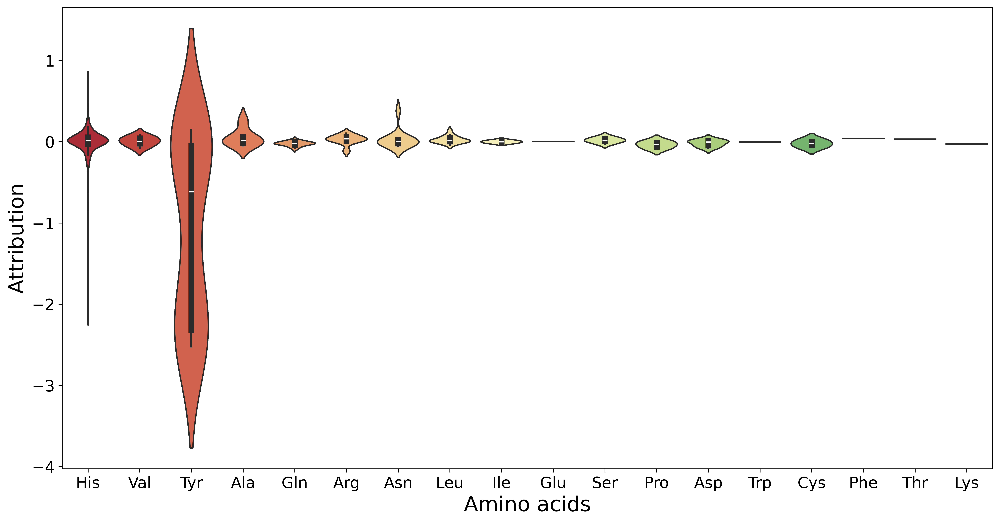

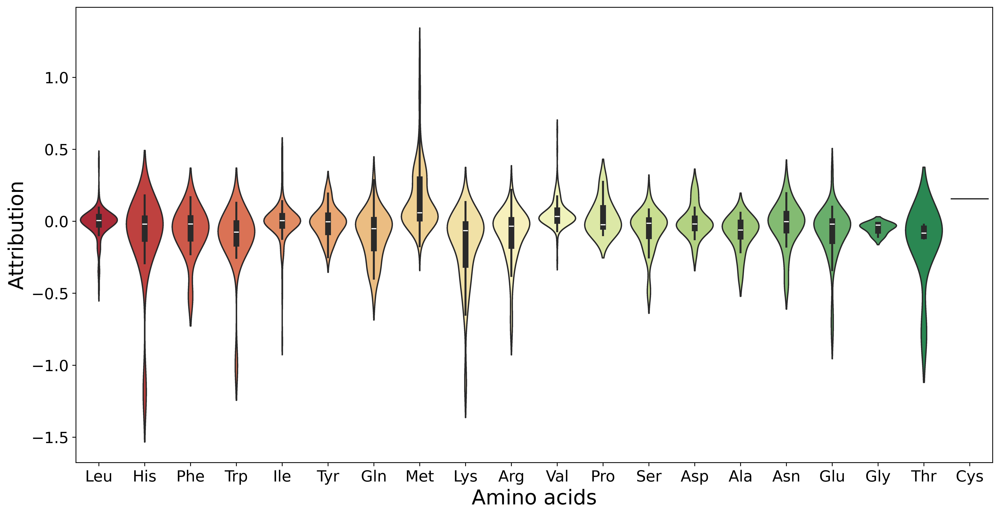

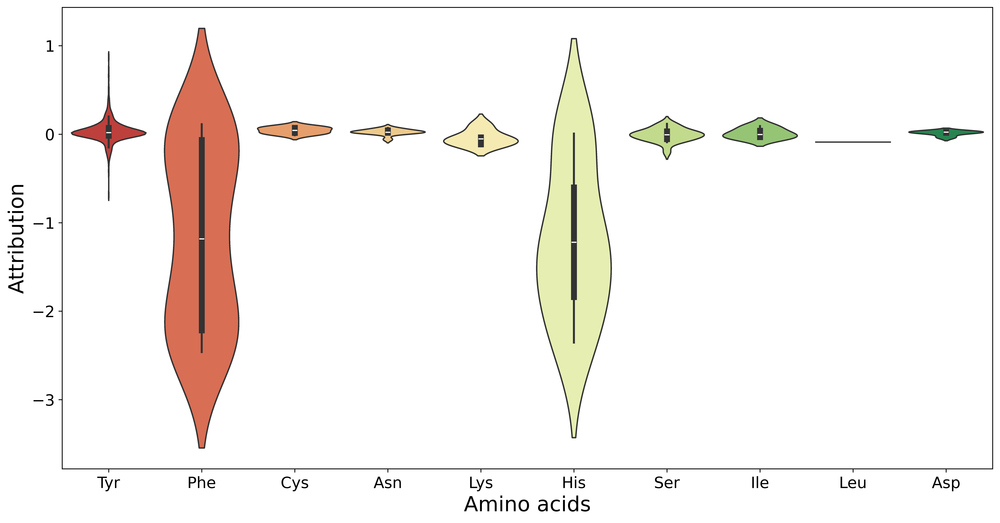

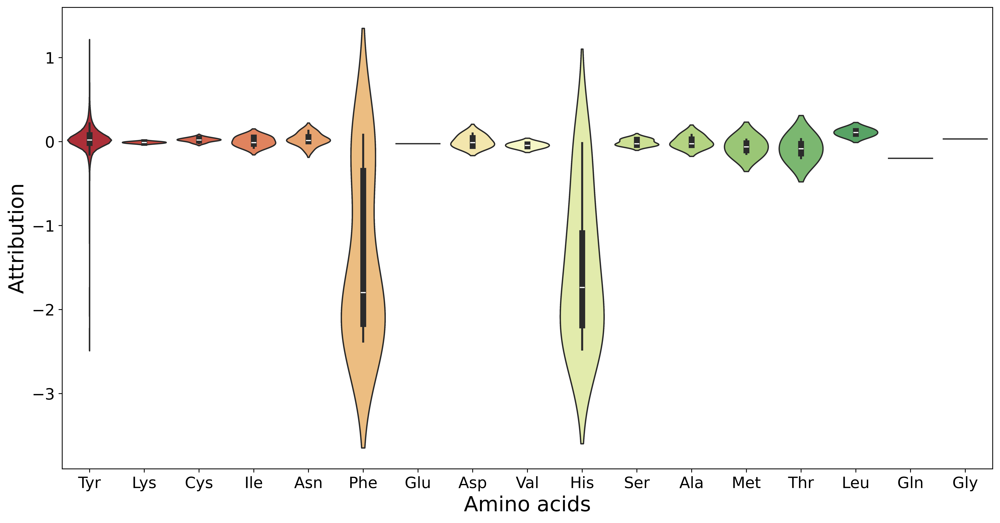

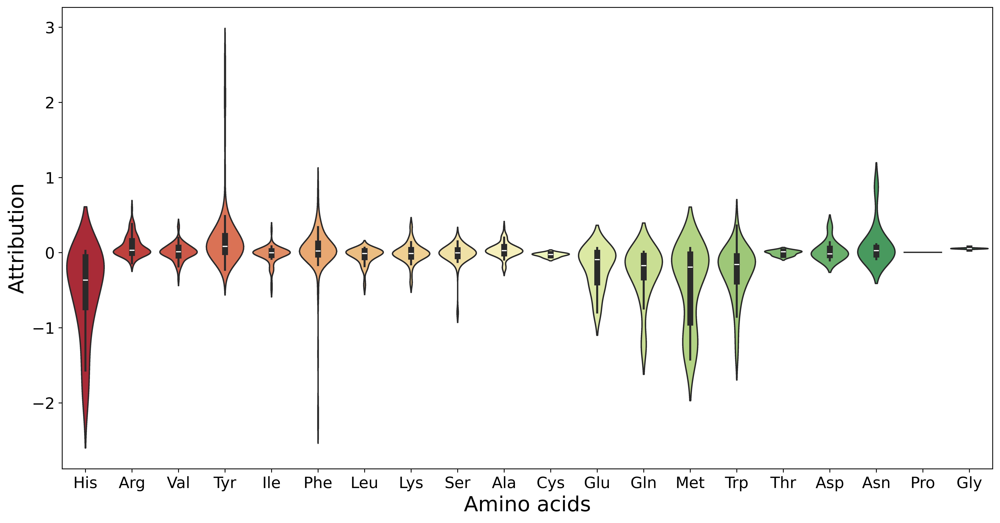

...

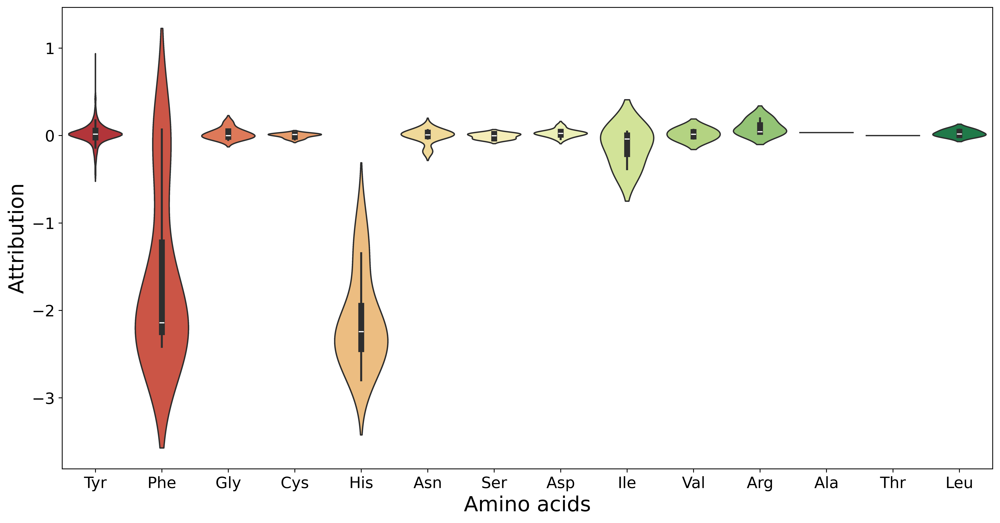

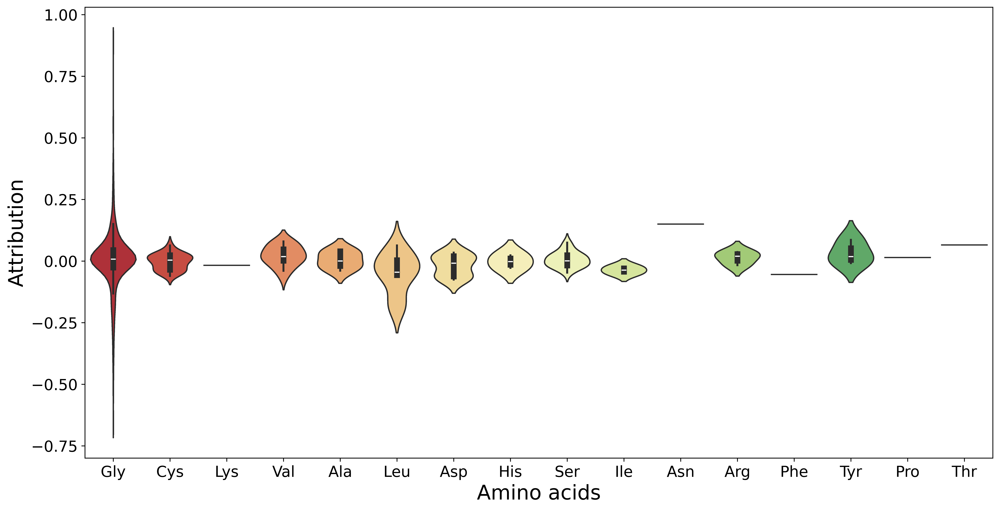

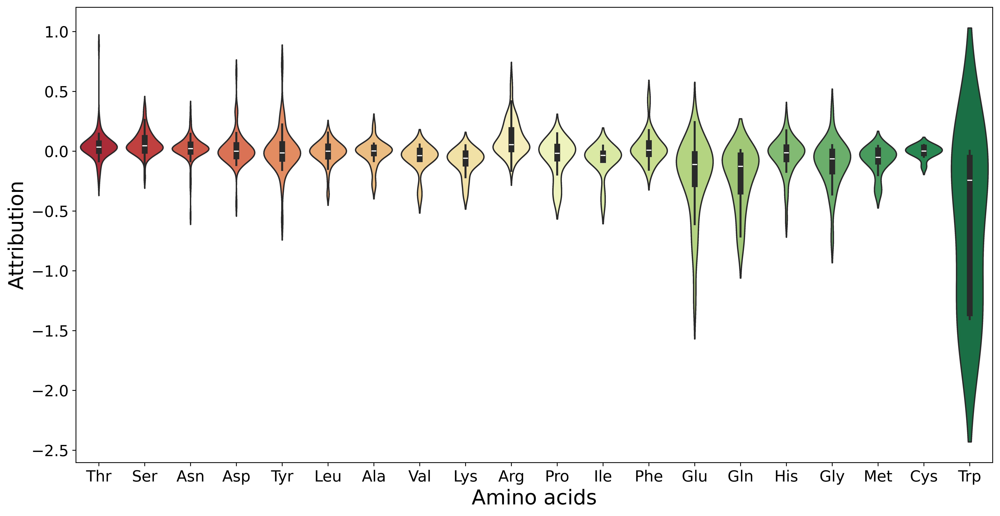

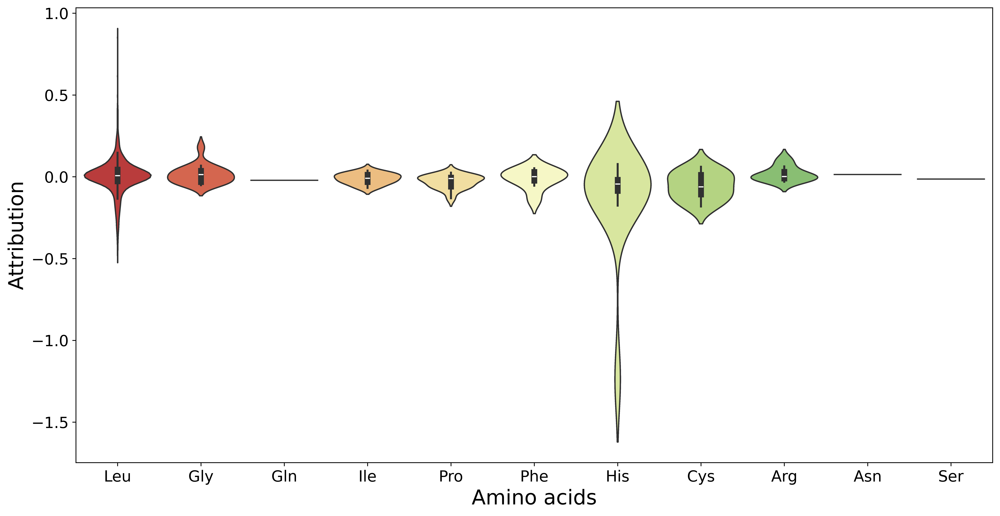

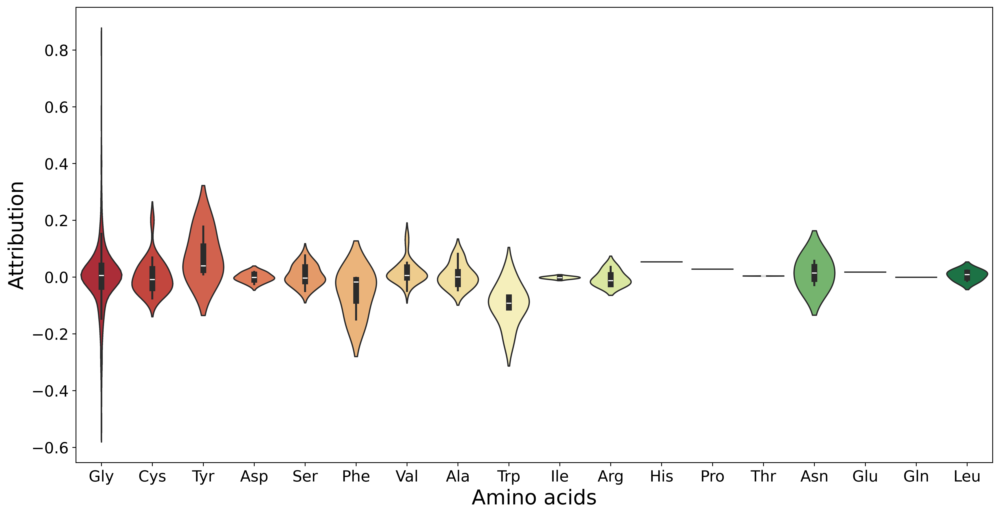

Insufficient distinct categories for pos 13
Insufficient distinct categories for pos 14


In [5]:
def plot_violin(
    data,
    pos=0,
    sample_size=500,
    figsize=(16, 8),
    modulo_val=15,
    dpi=600,
    random_seed=45,
):
    """
    Plot violin plot for given position.

    Parameters:
    - data: DataFrame to be plotted
    - pos: Position value to filter data
    - sample_size: Number of samples to draw from filtered data
    - figsize: Size of the figure
    - modulo_val: Value to calculate position index
    - dpi: Plot resolution
    - random_seed: Seed for random sampling
    """

    # Filter and sample data
    sub_data = data.iloc[
        [i for i in range(len(data)) if i % modulo_val == pos]
    ].sample(sample_size, random_state=random_seed)

    sub_name_list = sub_data["sub_name"].tolist()
    if len(set(sub_name_list)) < 2:
        print(f"Insufficient distinct categories for pos {pos}")
        return

    # Plotting
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    sns.violinplot(x="sub_name", y="attribution", hue="sub_name", data=sub_data, palette='RdYlGn', order=sub_name_list)

    # Customize plot appearance
    plt.legend([], [], frameon=False)
    font_base = {"size": 15}
    ax.set_ylabel("Attribution", fontdict={"weight": "normal", "size": 20})
    ax.set_xlabel("Amino acids", fontdict={"weight": "normal", "size": 20})
    plt.yticks(**font_base)
    plt.xticks(**font_base)
    
    plt.show()
    return fig, ax

# Plotting for each position
for i in range(15):
    plot_violin(data, pos=i, sample_size=1000)